## Task 2 - CLIP Fine-Tuning on the Visual Encoder

In [2]:
#@title GPU / Python / Torch sanity
import os, sys, subprocess, json, platform, torch
print("Python :", sys.version)
print("CUDA   :", torch.version.cuda)
print("Torch  :", torch.__version__)
print("Device :", torch.cuda.get_device_name(0) if torch.cuda.is_available() else "CPU")
!nvidia-smi || true

Python : 3.10.19 (main, Oct 21 2025, 16:43:05) [GCC 11.2.0]
CUDA   : 12.1
Torch  : 2.5.1+cu121
Device : NVIDIA GeForce RTX 4090
Tue Nov 11 20:25:06 2025       
+-----------------------------------------------------------------------------------------+
| NVIDIA-SMI 550.144.03             Driver Version: 550.144.03     CUDA Version: 12.4     |
|-----------------------------------------+------------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id          Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |           Memory-Usage | GPU-Util  Compute M. |
|                                         |                        |               MIG M. |
|=========================================+========================+======================|
|   0  NVIDIA GeForce RTX 4090        Off |   00000000:01:00.0 Off |                  Off |
| 40%   76C    P2            423W /  450W |    9874MiB /  24564MiB |    100%      Default |
|           

In [ ]:
# some imports
import torch
import torch.nn as nn
from torch.utils.data import DataLoader, random_split
from transformers import CLIPProcessor, CLIPModel, CLIPVisionModel, logging
from peft import LoraConfig, get_peft_model, TaskType
from torchinfo import summary
from tqdm.autonotebook import tqdm
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
from sklearn.metrics import classification_report, confusion_matrix
import json
import warnings

import pandas as pd 
import torch.optim as optim 
import time 
from datasets import load_dataset, disable_caching
# 解決 HuggingFace Datasets 的一個快取 bug
disable_caching()

In [4]:
# some settings
DEVICE = "cuda" if torch.cuda.is_available() else "cpu"
MODEL_ID = "openai/clip-vit-large-patch14" # pre-trained CLIP model (ViT-L/14)
BATCH_SIZE = 16 # adjust based on your GPU memory
gradient_accumulation_steps = 4 # adjust based on your GPU memory
# For Linear Probe & LoRA
NUM_EPOCHS = 1
print(f"Using device: {DEVICE}")

Using device: cuda


In [5]:
# CLIP settings
# --- Load CLIP Processor ---
processor = CLIPProcessor.from_pretrained(MODEL_ID)
# --- Define a transform to process images for CLIP ---
class CLIPTransform:
    def __init__(self, processor):
        self.processor = processor

    def __call__(self, image):
        # The processor expects a PIL image or list of images
        # It returns a dict, we extract 'pixel_values'
        # .squeeze(0) removes the batch dimension the processor adds
        return self.processor(images=image, return_tensors="pt")["pixel_values"].squeeze(0)

clip_transform = CLIPTransform(processor)

Using a slow image processor as `use_fast` is unset and a slow processor was saved with this model. `use_fast=True` will be the default behavior in v4.52, even if the model was saved with a slow processor. This will result in minor differences in outputs. You'll still be able to use a slow processor with `use_fast=False`.


In [ ]:
# dataset related imports
from torchvision.datasets import Flowers102 
from datasets import load_dataset

# --- START OF MODIFICATION ---
# 新增 import，為了解決 Task 1 遇到的 collate_fn 問題和載入 class names
import json
from torch.utils.data import DataLoader
# --- END OF MODIFICATION ---


# --- Flowers102 ---
# prepare Flowers102 dataset

# --- START OF MODIFICATION ---
# flowers102_test_dts = Flowers102(root="", split="test", transform=object) # evaluation on this set
flowers102_test_dts = Flowers102(root="", split="test", transform=clip_transform, download=True ) # evaluation on this set
# --- END OF MODIFICATION ---

# you should prepare the training set
# --- START OF MODIFICATION ---
# 依照作業指示，載入 "train" 和 "val" split
flowers_train_dts = Flowers102(root="", split="train", transform=clip_transform, download=True )
flowers_val_dts = Flowers102(root="", split="val", transform=clip_transform, download=True )
# --- END OF MODIFICATION ---


# --- START OF MODIFICATION ---
# print(f"Total training samples: {len(flowers102_train_dts)}")
# print(f"Total validation samples: {len(flowers102_val_dts)}")
print(f"Total Flowers training samples: {len(flowers_train_dts)}")
print(f"Total Flowers validation samples: {len(flowers_val_dts)}")
# --- END OF MODIFICATION ---
print(f"Total test samples: {len(flowers102_test_dts)}") # should be 6149

# prepare class names for Flowers102
"""
...
"""
# --- START OF MODIFICATION ---
with open('cat_to_name.json', 'r') as f:
    cat_to_name = json.load(f)
flowers102_class_names = [cat_to_name[str(i)] for i in range(1, 103)]
NUM_CLASSES_FLOWERS = len(flowers102_class_names)
print(f"Loaded {NUM_CLASSES_FLOWERS} class names for Flowers102.")
# --- END OF MODIFICATION ---


# --- CUB-200-2011 ---
print("\n--- Loading CUB-200-2011 ---")
birds_200 = load_dataset("bentrevett/caltech-ucsd-birds-200-2011")
cub_bird_test_dts = birds_200["test"]

# prepare the training set
train_val_split = birds_200["train"].train_test_split(test_size=0.1, seed=42, shuffle=True)
cub_train_dts = train_val_split["train"]
cub_val_dts = train_val_split["test"]

def cub_transform(examples):
    examples['pixel_values'] = [clip_transform(image.convert("RGB")) for image in examples['image']]
    return examples

cub_train_dts.set_transform(cub_transform)
cub_val_dts.set_transform(cub_transform)
cub_bird_test_dts.set_transform(cub_transform)


print(f"Total CUB training samples: {len(cub_train_dts)}")
print(f"Total CUB validation samples: {len(cub_val_dts)}")
print(f"Total test samples: {len(cub_bird_test_dts)}")


# prepare class names for CUB-200-2011
"""
...
"""
cub_class_names = birds_200["test"].features['label'].names
cub_class_names = [name.split('.')[-1].replace('_', ' ') for name in cub_class_names]
NUM_CLASSES_CUB = len(cub_class_names)
print(f"Loaded {NUM_CLASSES_CUB} class names for CUB-200-2011.")


# === Create DataLoaders ===
# --- START OF MODIFICATION ---
# 6 DataLoaders，CUB => collate_fn
def cub_collate_fn(batch_list):
    return {
        'pixel_values': torch.stack([item['pixel_values'] for item in batch_list]),
        'label': torch.tensor([item['label'] for item in batch_list])
    }

flowers_train_loader = DataLoader(dataset=flowers_train_dts, batch_size=BATCH_SIZE, shuffle=True)
flowers_val_loader = DataLoader(dataset=flowers_val_dts, batch_size=BATCH_SIZE, shuffle=False)

# flowers_test_loader = DataLoader(dataset=flowers_test_dts, batch_size=BATCH_SIZE, shuffle=False)
flowers_test_loader = DataLoader(dataset=flowers102_test_dts, batch_size=BATCH_SIZE, shuffle=False) 

cub_train_loader = DataLoader(dataset=cub_train_dts, batch_size=BATCH_SIZE, shuffle=True, collate_fn=cub_collate_fn)
cub_val_loader = DataLoader(dataset=cub_val_dts, batch_size=BATCH_SIZE, shuffle=False, collate_fn=cub_collate_fn)
cub_test_loader = DataLoader(dataset=cub_bird_test_dts, batch_size=BATCH_SIZE, shuffle=False, collate_fn=cub_collate_fn)

data_loaders = {
    "Flowers": {
        "train": flowers_train_loader,
        "val": flowers_val_loader,
        "test": flowers_test_loader,
        "num_classes": NUM_CLASSES_FLOWERS,
        "class_names": flowers102_class_names,
        "is_torchvision": True 
    },
    "CUB": {
        "train": cub_train_loader,
        "val": cub_val_loader,
        "test": cub_test_loader,
        "num_classes": NUM_CLASSES_CUB,
        "class_names": cub_class_names,
        "is_torchvision": False 
    }
}
print("\nAll DataLoaders created and stored in 'data_loaders' dict.")

Total Flowers training samples: 1020
Total Flowers validation samples: 1020
Total test samples: 6149
Loaded 102 class names for Flowers102.

--- Loading CUB-200-2011 ---
Total CUB training samples: 5394
Total CUB validation samples: 600
Total test samples: 5794
Loaded 200 class names for CUB-200-2011.

All DataLoaders created and stored in 'data_loaders' dict.


In [ ]:
# New added cell: some function

def train_one_epoch(model, head, train_loader, optimizer, criterion, is_torchvision, is_lora=False):
    """
    is_lora=True:  模型(model)本身會被訓練 (e.g., LoRA)
    is_lora=False: 模型(model)被凍結，只有 head 會被訓練 (e.g., Linear Probe)
    """
    if is_lora:
        model.train() 
    else:
        model.eval() 
    head.train() 
    
    total_loss = 0.0
    
    for batch in tqdm(train_loader, desc=f"Training (LoRA={is_lora})", leave=False):
        
        # 1. 處理不同資料格式
        if is_torchvision:
            images, labels = batch
            images, labels = images.to(DEVICE), labels.to(DEVICE)
        else: # CUB
            images = batch['pixel_values'].to(DEVICE)
            labels = batch['label'].to(DEVICE)
            
        # 2. init grad
        optimizer.zero_grad()
        
        # 3. Forward pass
        with torch.no_grad() if not is_lora else torch.enable_grad():
            # (batch_size, 1024) -> ViT L/14 [cite: 75] 的 hidden_size
            image_features = model(pixel_values=images).pooler_output
        
        # (batch_size, num_classes)
        outputs = head(image_features)
        
        # 4. Loss
        loss = criterion(outputs, labels)
        
        # 5. Backward pass
        loss.backward()
        
        # 6. update weight
        optimizer.step()
        
        total_loss += loss.item() * images.size(0)
        
    return total_loss / len(train_loader.dataset)


def validate(model, head, val_loader, criterion, is_torchvision):
    model.eval() 
    head.eval() 
    
    total_loss = 0.0
    correct = 0
    total = 0
    
    with torch.no_grad():
        for batch in tqdm(val_loader, desc="Validating", leave=False):
            # 1. format 
            if is_torchvision:
                images, labels = batch
                images, labels = images.to(DEVICE), labels.to(DEVICE)
            else: # CUB
                images = batch['pixel_values'].to(DEVICE)
                labels = batch['label'].to(DEVICE)

            # 2. Forward pass
            image_features = model(pixel_values=images).pooler_output
            outputs = head(image_features)
            
            # 3. Loss
            loss = criterion(outputs, labels)
            total_loss += loss.item() * images.size(0)
            
            # 4. Accuracy
            _, predicted = torch.max(outputs.data, 1)
            total += labels.size(0)
            correct += (predicted == labels).sum().item()

    avg_loss = total_loss / len(val_loader.dataset)
    avg_acc = correct / total
    return avg_loss, avg_acc


def run_training(model, head, optimizer, criterion, dataset_key, num_epochs=10, is_lora=False):
    loader_dict = data_loaders[dataset_key]
    train_loader = loader_dict["train"]
    val_loader = loader_dict["val"]
    is_torchvision = loader_dict["is_torchvision"]
    
    train_losses, val_losses, val_accuracies = [], [], []

    for epoch in range(num_epochs):
        epoch_start_time = time.time()
        
        train_loss = train_one_epoch(
            model, head, train_loader, optimizer, criterion, is_torchvision, is_lora
        )
        
        val_loss, val_acc = validate(
            model, head, val_loader, criterion, is_torchvision
        )
        
        train_losses.append(train_loss)
        val_losses.append(val_loss)
        val_accuracies.append(val_acc)
        
        epoch_end_time = time.time()
        
        print(f"Epoch {epoch+1}/{num_epochs} - "
              f"Train Loss: {train_loss:.4f} | "
              f"Val Loss: {val_loss:.4f} | Val Acc: {val_acc*100:.2f}% | "
              f"Time: {epoch_end_time - epoch_start_time:.2f} sec")
        
    return train_losses, val_losses, val_accuracies

def plot_curves(train_losses, val_losses, val_accuracies, title_prefix):
    """繪製訓練/驗證曲線 [cite: 80]"""
    
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(18, 6))
    
    # Loss Curve
    ax1.plot(train_losses, label="Train Loss")
    ax1.plot(val_losses, label="Validation Loss")
    ax1.set_xlabel("Epoch")
    ax1.set_ylabel("Loss")
    ax1.set_title(f"{title_prefix} - Loss Curve")
    ax1.legend()
    
    # Accuracy Curve
    ax2.plot(val_accuracies, label="Validation Accuracy", color='green')
    ax2.set_xlabel("Epoch")
    ax2.set_ylabel("Accuracy")
    ax2.set_title(f"{title_prefix} - Validation Accuracy")
    ax2.legend()
    
    # store
    filename = f"{title_prefix.lower().replace(' ', '_')}_curves.png"
    plt.savefig(filename)
    print(f"Saved training curves to {filename}")
    plt.show()

def run_test(model, head, dataset_key):
    loader_dict = data_loaders[dataset_key]
    test_loader = loader_dict["test"]
    is_torchvision = loader_dict["is_torchvision"]
    class_names = loader_dict["class_names"]

    model.eval()
    head.eval()
    
    all_preds = []
    all_labels = []
    
    with torch.no_grad():
        for batch in tqdm(test_loader, desc="Testing"):
            if is_torchvision:
                images, labels = batch
                images, labels = images.to(DEVICE), labels.to(DEVICE)
            else: # CUB
                images = batch['pixel_values'].to(DEVICE)
                labels = batch['label'].to(DEVICE)
                
            image_features = model(pixel_values=images).pooler_output
            outputs = head(image_features)
            
            _, predicted = torch.max(outputs.data, 1)
            
            all_preds.extend(predicted.cpu().numpy())
            all_labels.extend(labels.cpu().numpy())

    test_acc = accuracy_score(all_labels, all_preds)
    print(f"\n--- Test Result for {dataset_key} ---")
    print(f"Test Accuracy: {test_acc*100:.2f}%")
    
    # 印出 Classification Report [cite: 81]
    print("\nClassification Report:")
    print(classification_report(all_labels, all_preds, target_names=class_names, zero_division=0))
    
    return all_labels, all_preds

def visualize_task2_predictions(all_labels, all_preds, dataset_key, title_prefix):
    print(f"Generating visualization for {title_prefix}...")
    loader_dict = data_loaders[dataset_key]
    class_names = loader_dict["class_names"]
    is_torchvision = loader_dict["is_torchvision"]

    if is_torchvision: # Flowers
        dset_viz = Flowers102(root="", split="test", transform=None, download=True)
        get_item = lambda i: dset_viz[i] # (img, label)
    else: # CUB
        dset_viz = load_dataset("bentrevett/caltech-ucsd-birds-200-2011")["test"]
        get_item = lambda i: (dset_viz[i]['image'], dset_viz[i]['label'])

    plt.figure(figsize=(20, 10))
    correct_indices = [i for i, (l, p) in enumerate(zip(all_labels, all_preds)) if l == p]
    incorrect_indices = [i for i, (l, p) in enumerate(zip(all_labels, all_preds)) if l != p]
    
    import random
    viz_indices = random.sample(correct_indices, min(4, len(correct_indices))) + \
                  random.sample(incorrect_indices, min(4, len(incorrect_indices)))
    
    plt.suptitle(f"{title_prefix} (Green=Correct, Red=Incorrect)", fontsize=20)
    
    for i, idx in enumerate(viz_indices):
        img, label = get_item(idx)
        pred_label = all_preds[idx]
        color = "green" if label == pred_label else "red"
        
        plt.subplot(2, 4, i + 1)
        plt.imshow(img)
        plt.title(f"True: {class_names[label]}\nPred: {class_names[pred_label]}", color=color, fontsize=10)
        plt.axis("off")

    filename = f"{title_prefix.lower().replace(' ', '_')}_demo.png"
    plt.tight_layout(rect=[0, 0.03, 1, 0.95])
    plt.savefig(filename)
    print(f"Saved demonstration to {filename}")
    plt.show()

In [8]:
# print("--- Starting Method: Linear Probing ---")

# # === 1. Load CLIP Vision Model (no text part) ===
# model = ...

# # === 2. Freeze backbone ===
# for p in vision_model.parameters():
#     p.requires_grad = False
# for p in visual_projection.parameters():
#     p.requires_grad = False

# # === 3. Classifier head ===
# head = # ...
    
# # === 4. Training setup ===
# criterion = nn.CrossEntropyLoss()
# optimizer = torch.optim.Adam(object, lr=lr)
# train_losses, val_losses, val_accuracies = [], [], []

# # === 5. Training Loop ===
# for epoch in range(NUM_EPOCHS):
#     head.train()
#     """
#     ...
#     """
#     for batch in tqdm(train_loader, desc=f"Epoch {epoch+1}/{NUM_EPOCHS} [Train]"):
#         pass
#         """
#         ...
#         """
    
#     print(f"Epoch {epoch+1} - Train Loss: {train_losses[-1]:.4f} | "
#           f"Val Loss: {val_losses[-1]:.4f} | Val Acc: {val_accuracies[-1]*100:.2f}% | "
#           f"Time: {epoch_end - epoch_start:.2f} sec")

# # === 6. Plot curves ===


# # === 7. Test ===


# # === 8. Visualization ===


--- Starting Method: Linear Probing ---
Loaded openai/clip-vit-large-patch14 vision model to cuda.
Vision model backbone frozen.
Created new linear head (1024 -> 102).

Starting Linear Probe training for Flowers...


Training (LoRA=False):   0%|          | 0/64 [00:00<?, ?it/s]

Validating:   0%|          | 0/64 [00:00<?, ?it/s]

Epoch 1/10 - Train Loss: 2.9675 | Val Loss: 0.9085 | Val Acc: 90.39% | Time: 31.88 sec


Training (LoRA=False):   0%|          | 0/64 [00:00<?, ?it/s]

Validating:   0%|          | 0/64 [00:00<?, ?it/s]

Epoch 2/10 - Train Loss: 0.3743 | Val Loss: 0.3306 | Val Acc: 97.35% | Time: 31.15 sec


Training (LoRA=False):   0%|          | 0/64 [00:00<?, ?it/s]

Validating:   0%|          | 0/64 [00:00<?, ?it/s]

Epoch 3/10 - Train Loss: 0.1245 | Val Loss: 0.2196 | Val Acc: 98.63% | Time: 31.45 sec


Training (LoRA=False):   0%|          | 0/64 [00:00<?, ?it/s]

Validating:   0%|          | 0/64 [00:00<?, ?it/s]

Epoch 4/10 - Train Loss: 0.0687 | Val Loss: 0.1754 | Val Acc: 98.73% | Time: 31.33 sec


Training (LoRA=False):   0%|          | 0/64 [00:00<?, ?it/s]

Validating:   0%|          | 0/64 [00:00<?, ?it/s]

Epoch 5/10 - Train Loss: 0.0455 | Val Loss: 0.1487 | Val Acc: 99.12% | Time: 30.83 sec


Training (LoRA=False):   0%|          | 0/64 [00:00<?, ?it/s]

Validating:   0%|          | 0/64 [00:00<?, ?it/s]

Epoch 6/10 - Train Loss: 0.0336 | Val Loss: 0.1365 | Val Acc: 99.02% | Time: 31.44 sec


Training (LoRA=False):   0%|          | 0/64 [00:00<?, ?it/s]

Validating:   0%|          | 0/64 [00:00<?, ?it/s]

Epoch 7/10 - Train Loss: 0.0254 | Val Loss: 0.1237 | Val Acc: 99.02% | Time: 31.54 sec


Training (LoRA=False):   0%|          | 0/64 [00:00<?, ?it/s]

Validating:   0%|          | 0/64 [00:00<?, ?it/s]

Epoch 8/10 - Train Loss: 0.0203 | Val Loss: 0.1147 | Val Acc: 99.12% | Time: 31.45 sec


Training (LoRA=False):   0%|          | 0/64 [00:00<?, ?it/s]

Validating:   0%|          | 0/64 [00:00<?, ?it/s]

Epoch 9/10 - Train Loss: 0.0169 | Val Loss: 0.1078 | Val Acc: 99.12% | Time: 30.60 sec


Training (LoRA=False):   0%|          | 0/64 [00:00<?, ?it/s]

Validating:   0%|          | 0/64 [00:00<?, ?it/s]

Epoch 10/10 - Train Loss: 0.0142 | Val Loss: 0.1019 | Val Acc: 99.22% | Time: 31.41 sec
Saved training curves to linear_probing_-_flowers_curves.png


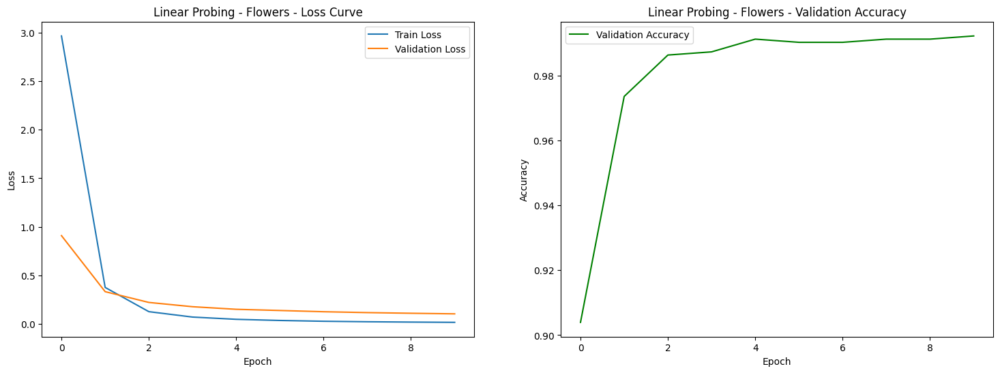


Running final test for Linear Probing - Flowers...


Testing:   0%|          | 0/385 [00:00<?, ?it/s]


--- Test Result for Flowers ---
Test Accuracy: 98.39%

Classification Report:
                           precision    recall  f1-score   support

            pink primrose       1.00      1.00      1.00        20
hard-leaved pocket orchid       1.00      1.00      1.00        40
         canterbury bells       0.86      0.90      0.88        20
                sweet pea       1.00      0.92      0.96        36
         english marigold       1.00      1.00      1.00        45
               tiger lily       1.00      1.00      1.00        25
              moon orchid       1.00      1.00      1.00        20
         bird of paradise       1.00      1.00      1.00        65
                monkshood       0.96      0.96      0.96        26
            globe thistle       0.96      0.92      0.94        25
               snapdragon       0.97      0.97      0.97        67
              colt's foot       0.94      1.00      0.97        67
              king protea       1.00      1.00   

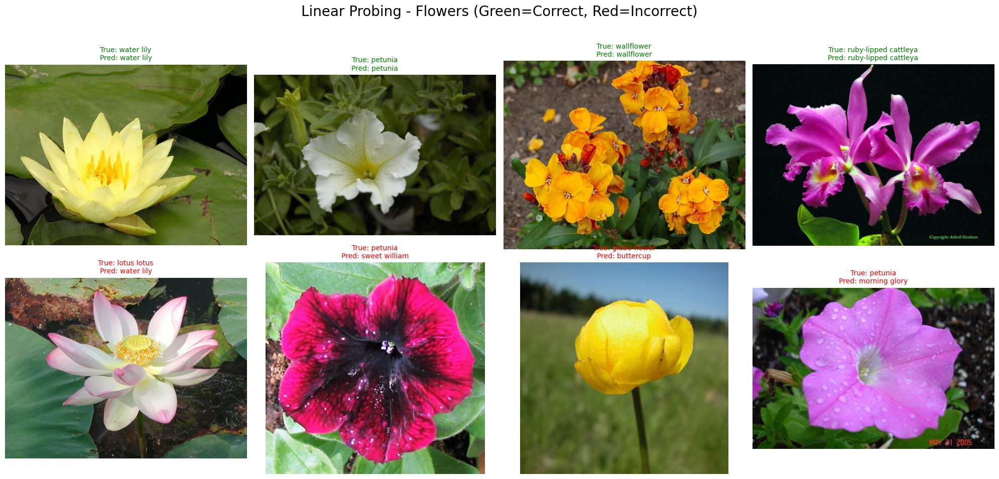

In [ ]:
print("--- Starting Method: Linear Probing ---")
from sklearn.metrics import accuracy_score, classification_report
# === 1. Flowers ===
DATASET_TO_USE = "Flowers" 
NUM_EPOCHS_LP = 10
LEARNING_RATE_LP = 1e-3
# ================================================

dataset_info = data_loaders[DATASET_TO_USE]
num_classes = dataset_info["num_classes"]

# === 2. Load CLIP Vision Model ===
vision_model = CLIPVisionModel.from_pretrained(MODEL_ID).to(DEVICE)
print(f"Loaded {MODEL_ID} vision model to {DEVICE}.")

# === 3. Freeze backbone ===
for param in vision_model.parameters():
    param.requires_grad = False
vision_model.eval()
print("Vision model backbone frozen.")

# === 4. Classifier head ===
# ViT-L/14 的 hidden size 是 1024
hidden_dim = vision_model.config.hidden_size
head = nn.Linear(hidden_dim, num_classes).to(DEVICE)
print(f"Created new linear head ({hidden_dim} -> {num_classes}).")
    
# === 5. Training setup ===
criterion = nn.CrossEntropyLoss()
#
optimizer = torch.optim.Adam(head.parameters(), lr=LEARNING_RATE_LP) 

print(f"\nStarting Linear Probe training for {DATASET_TO_USE}...")

# === 6. Training Loop ===
train_losses_lp, val_losses_lp, val_accuracies_lp = run_training(
    model=vision_model,
    head=head,
    optimizer=optimizer,
    criterion=criterion,
    dataset_key=DATASET_TO_USE,
    num_epochs=NUM_EPOCHS_LP,
    is_lora=False 
)

# === 7. Plot curves === [cite: 80]
plot_curves(
    train_losses_lp, val_losses_lp, val_accuracies_lp, 
    title_prefix=f"Linear Probing - {DATASET_TO_USE}"
)

# === 8. Test === [cite: 81]
print(f"\nRunning final test for Linear Probing - {DATASET_TO_USE}...")
lp_labels, lp_preds = run_test(vision_model, head, DATASET_TO_USE)

visualize_task2_predictions(
    lp_labels, lp_preds, DATASET_TO_USE, 
    title_prefix=f"Linear Probing - {DATASET_TO_USE}"
)

--- Starting Method: Linear Probing ---
Loaded openai/clip-vit-large-patch14 vision model to cuda.
Vision model backbone frozen.
Created new linear head (1024 -> 200).

Starting Linear Probe training for CUB...


Training (LoRA=False):   0%|          | 0/338 [00:00<?, ?it/s]

Validating:   0%|          | 0/38 [00:00<?, ?it/s]

Epoch 1/10 - Train Loss: 2.1606 | Val Loss: 0.9801 | Val Acc: 72.83% | Time: 88.46 sec


Training (LoRA=False):   0%|          | 0/338 [00:00<?, ?it/s]

Validating:   0%|          | 0/38 [00:00<?, ?it/s]

Epoch 2/10 - Train Loss: 0.5413 | Val Loss: 0.7936 | Val Acc: 76.17% | Time: 87.71 sec


Training (LoRA=False):   0%|          | 0/338 [00:00<?, ?it/s]

Validating:   0%|          | 0/38 [00:00<?, ?it/s]

Epoch 3/10 - Train Loss: 0.3133 | Val Loss: 0.7531 | Val Acc: 79.00% | Time: 87.57 sec


Training (LoRA=False):   0%|          | 0/338 [00:00<?, ?it/s]

Validating:   0%|          | 0/38 [00:00<?, ?it/s]

Epoch 4/10 - Train Loss: 0.2100 | Val Loss: 0.6984 | Val Acc: 80.83% | Time: 87.41 sec


Training (LoRA=False):   0%|          | 0/338 [00:00<?, ?it/s]

Validating:   0%|          | 0/38 [00:00<?, ?it/s]

Epoch 5/10 - Train Loss: 0.1345 | Val Loss: 0.7063 | Val Acc: 81.17% | Time: 88.40 sec


Training (LoRA=False):   0%|          | 0/338 [00:00<?, ?it/s]

Validating:   0%|          | 0/38 [00:00<?, ?it/s]

Epoch 6/10 - Train Loss: 0.0902 | Val Loss: 0.7111 | Val Acc: 80.17% | Time: 87.63 sec


Training (LoRA=False):   0%|          | 0/338 [00:00<?, ?it/s]

Validating:   0%|          | 0/38 [00:00<?, ?it/s]

Epoch 7/10 - Train Loss: 0.0713 | Val Loss: 0.6634 | Val Acc: 83.17% | Time: 89.04 sec


Training (LoRA=False):   0%|          | 0/338 [00:00<?, ?it/s]

Validating:   0%|          | 0/38 [00:00<?, ?it/s]

Epoch 8/10 - Train Loss: 0.0486 | Val Loss: 0.6687 | Val Acc: 81.50% | Time: 53.32 sec


Training (LoRA=False):   0%|          | 0/338 [00:00<?, ?it/s]

Validating:   0%|          | 0/38 [00:00<?, ?it/s]

Epoch 9/10 - Train Loss: 0.0396 | Val Loss: 0.7134 | Val Acc: 82.67% | Time: 52.06 sec


Training (LoRA=False):   0%|          | 0/338 [00:00<?, ?it/s]

Validating:   0%|          | 0/38 [00:00<?, ?it/s]

Epoch 10/10 - Train Loss: 0.0345 | Val Loss: 0.6781 | Val Acc: 83.83% | Time: 52.03 sec
Saved training curves to linear_probing_-_cub_curves.png


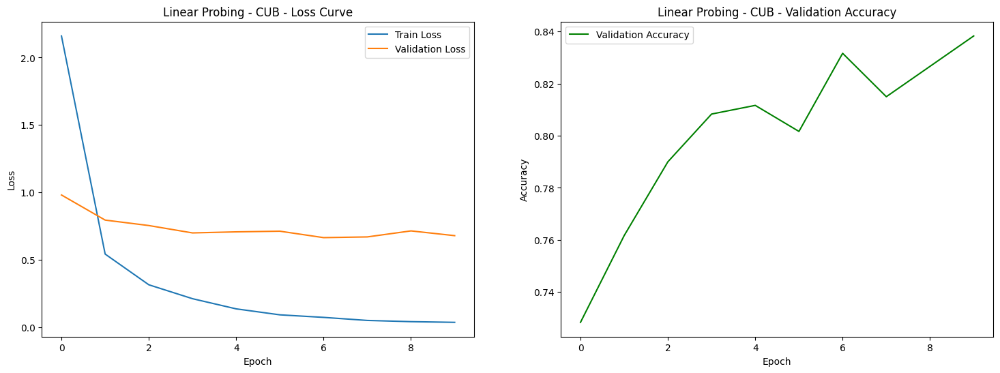


Running final test for Linear Probing - CUB...


Testing:   0%|          | 0/363 [00:00<?, ?it/s]


--- Test Result for CUB ---
Test Accuracy: 83.88%

Classification Report:
                                precision    recall  f1-score   support

        Black footed Albatross       0.93      0.83      0.88        30
              Laysan Albatross       0.88      0.93      0.90        30
               Sooty Albatross       0.84      0.93      0.88        28
             Groove billed Ani       1.00      0.97      0.98        30
                Crested Auklet       0.92      0.86      0.89        14
                  Least Auklet       0.85      1.00      0.92        11
               Parakeet Auklet       1.00      0.91      0.95        23
             Rhinoceros Auklet       0.77      0.94      0.85        18
              Brewer Blackbird       0.63      0.76      0.69        29
          Red winged Blackbird       1.00      0.97      0.98        30
               Rusty Blackbird       0.85      0.57      0.68        30
       Yellow headed Blackbird       0.96      1.00      0.9

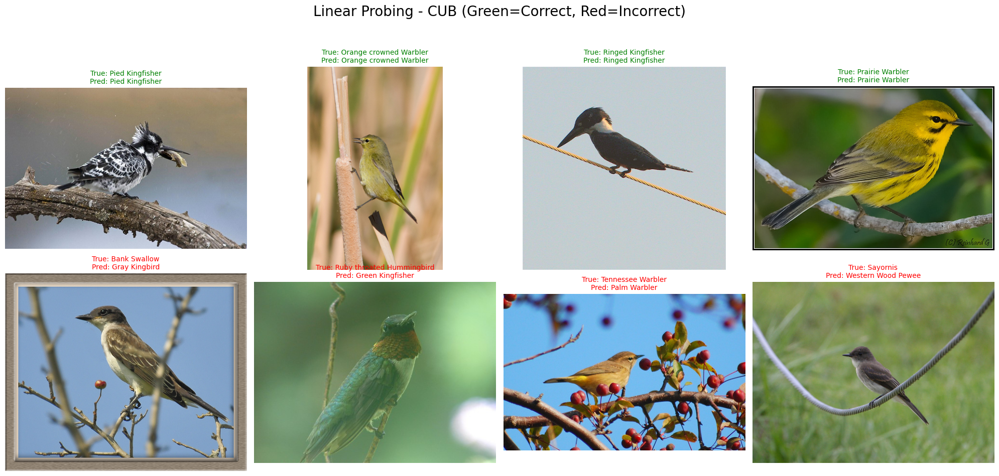

In [ ]:
print("--- Starting Method: Linear Probing ---")
from sklearn.metrics import accuracy_score, classification_report
# === 1.CUB ===
DATASET_TO_USE = "CUB"
NUM_EPOCHS_LP = 10
LEARNING_RATE_LP = 1e-3

dataset_info = data_loaders[DATASET_TO_USE]
num_classes = dataset_info["num_classes"]

# === 2. Load CLIP Vision Model ===
vision_model = CLIPVisionModel.from_pretrained(MODEL_ID).to(DEVICE)
print(f"Loaded {MODEL_ID} vision model to {DEVICE}.")

# === 3. Freeze backbone ===
for param in vision_model.parameters():
    param.requires_grad = False
vision_model.eval()
print("Vision model backbone frozen.")

# === 4. Classifier head ===
hidden_dim = vision_model.config.hidden_size
head = nn.Linear(hidden_dim, num_classes).to(DEVICE)
print(f"Created new linear head ({hidden_dim} -> {num_classes}).")
    
# === 5. Training setup ===
criterion = nn.CrossEntropyLoss()
optimizer = torch.optim.Adam(head.parameters(), lr=LEARNING_RATE_LP) 

print(f"\nStarting Linear Probe training for {DATASET_TO_USE}...")

# === 6. Training Loop ===
train_losses_lp, val_losses_lp, val_accuracies_lp = run_training(
    model=vision_model,
    head=head,
    optimizer=optimizer,
    criterion=criterion,
    dataset_key=DATASET_TO_USE,
    num_epochs=NUM_EPOCHS_LP,
    is_lora=False
)

# === 7. Plot curves ===
plot_curves(
    train_losses_lp, val_losses_lp, val_accuracies_lp, 
    title_prefix=f"Linear Probing - {DATASET_TO_USE}"
)

# === 8. Test === 
print(f"\nRunning final test for Linear Probing - {DATASET_TO_USE}...")
lp_labels, lp_preds = run_test(vision_model, head, DATASET_TO_USE)

visualize_task2_predictions(
    lp_labels, lp_preds, DATASET_TO_USE, 
    title_prefix=f"Linear Probing - {DATASET_TO_USE}"
)

In [11]:
# print("--- Starting Method: LoRA Fine-Tuning ---")

# # === 1. Load CLIP Vision Model (no text part) ===
# model = ...

# # === 2. LoRA config (Q/V projections) ===
# lora_config = LoraConfig(
#     "..."
# )

# # === 3. Wrap with PEFT ===
# vision_model_lora = get_peft_model(vision_model, lora_config)
# print("LoRA Model - Trainable Parameters:")
# vision_model_lora.print_trainable_parameters()

# # === 4. Freeze projection ===
# for p in visual_projection.parameters():
#     p.requires_grad = False

# # === 5. Training setup ===
# criterion = nn.CrossEntropyLoss()
# optimizer = torch.optim.Adam(object, lr=lr)
# train_losses, val_losses, val_accuracies = [], [], []

# # === 5. Training Loop ===
# for epoch in range(NUM_EPOCHS):
#     head.train()
#     """
#     ...
#     """
#     for batch in tqdm(train_loader, desc=f"Epoch {epoch+1}/{NUM_EPOCHS} [Train]"):
#         pass
#         """
#         ...
#         """
    
#     print(f"Epoch {epoch+1} - Train Loss: {train_losses[-1]:.4f} | "
#           f"Val Loss: {val_losses[-1]:.4f} | Val Acc: {val_accuracies[-1]*100:.2f}% | "
#           f"Time: {epoch_end - epoch_start:.2f} sec")

# # === 6. Plot curves ===


# # === 7. Test ===


# # === 8. Visualization ===


--- Starting Method: LoRA Fine-Tuning ---
Loaded openai/clip-vit-large-patch14 vision model to cuda.

Wrapped vision model with LoRA (PEFT).
LoRA Model - Trainable Parameters:
trainable params: 1,572,864 || all params: 304,752,640 || trainable%: 0.5161
Created new linear head (1024 -> 102).

Starting LoRA Fine-Tuning for Flowers...


Training (LoRA=True):   0%|          | 0/64 [00:00<?, ?it/s]

Validating:   0%|          | 0/64 [00:00<?, ?it/s]

Epoch 1/10 - Train Loss: 4.4466 | Val Loss: 3.7717 | Val Acc: 37.65% | Time: 26.80 sec


Training (LoRA=True):   0%|          | 0/64 [00:00<?, ?it/s]

Validating:   0%|          | 0/64 [00:00<?, ?it/s]

Epoch 2/10 - Train Loss: 2.9323 | Val Loss: 2.1529 | Val Acc: 87.06% | Time: 26.85 sec


Training (LoRA=True):   0%|          | 0/64 [00:00<?, ?it/s]

Validating:   0%|          | 0/64 [00:00<?, ?it/s]

Epoch 3/10 - Train Loss: 1.3649 | Val Loss: 1.0624 | Val Acc: 94.22% | Time: 26.79 sec


Training (LoRA=True):   0%|          | 0/64 [00:00<?, ?it/s]

Validating:   0%|          | 0/64 [00:00<?, ?it/s]

Epoch 4/10 - Train Loss: 0.5609 | Val Loss: 0.6266 | Val Acc: 97.75% | Time: 26.80 sec


Training (LoRA=True):   0%|          | 0/64 [00:00<?, ?it/s]

Validating:   0%|          | 0/64 [00:00<?, ?it/s]

Epoch 5/10 - Train Loss: 0.2679 | Val Loss: 0.4291 | Val Acc: 98.04% | Time: 26.82 sec


Training (LoRA=True):   0%|          | 0/64 [00:00<?, ?it/s]

Validating:   0%|          | 0/64 [00:00<?, ?it/s]

Epoch 6/10 - Train Loss: 0.1509 | Val Loss: 0.3377 | Val Acc: 97.84% | Time: 26.80 sec


Training (LoRA=True):   0%|          | 0/64 [00:00<?, ?it/s]

Validating:   0%|          | 0/64 [00:00<?, ?it/s]

Epoch 7/10 - Train Loss: 0.0976 | Val Loss: 0.2797 | Val Acc: 98.24% | Time: 26.81 sec


Training (LoRA=True):   0%|          | 0/64 [00:00<?, ?it/s]

Validating:   0%|          | 0/64 [00:00<?, ?it/s]

Epoch 8/10 - Train Loss: 0.0688 | Val Loss: 0.2471 | Val Acc: 98.14% | Time: 26.77 sec


Training (LoRA=True):   0%|          | 0/64 [00:00<?, ?it/s]

Validating:   0%|          | 0/64 [00:00<?, ?it/s]

Epoch 9/10 - Train Loss: 0.0523 | Val Loss: 0.2201 | Val Acc: 98.43% | Time: 26.80 sec


Training (LoRA=True):   0%|          | 0/64 [00:00<?, ?it/s]

Validating:   0%|          | 0/64 [00:00<?, ?it/s]

Epoch 10/10 - Train Loss: 0.0412 | Val Loss: 0.2011 | Val Acc: 98.33% | Time: 26.79 sec
Saved training curves to lora_fine-tuning_-_flowers_curves.png


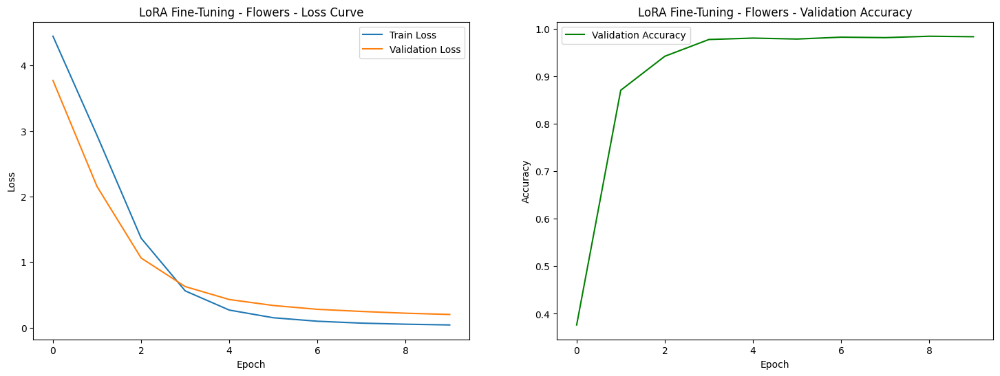


Running final test for LoRA Fine-Tuning - Flowers...


Testing:   0%|          | 0/385 [00:00<?, ?it/s]


--- Test Result for Flowers ---
Test Accuracy: 98.31%

Classification Report:
                           precision    recall  f1-score   support

            pink primrose       1.00      1.00      1.00        20
hard-leaved pocket orchid       1.00      1.00      1.00        40
         canterbury bells       0.94      0.85      0.89        20
                sweet pea       1.00      0.92      0.96        36
         english marigold       1.00      0.98      0.99        45
               tiger lily       1.00      1.00      1.00        25
              moon orchid       0.95      1.00      0.98        20
         bird of paradise       1.00      1.00      1.00        65
                monkshood       1.00      0.96      0.98        26
            globe thistle       1.00      1.00      1.00        25
               snapdragon       0.97      0.97      0.97        67
              colt's foot       0.96      0.97      0.96        67
              king protea       0.97      1.00   

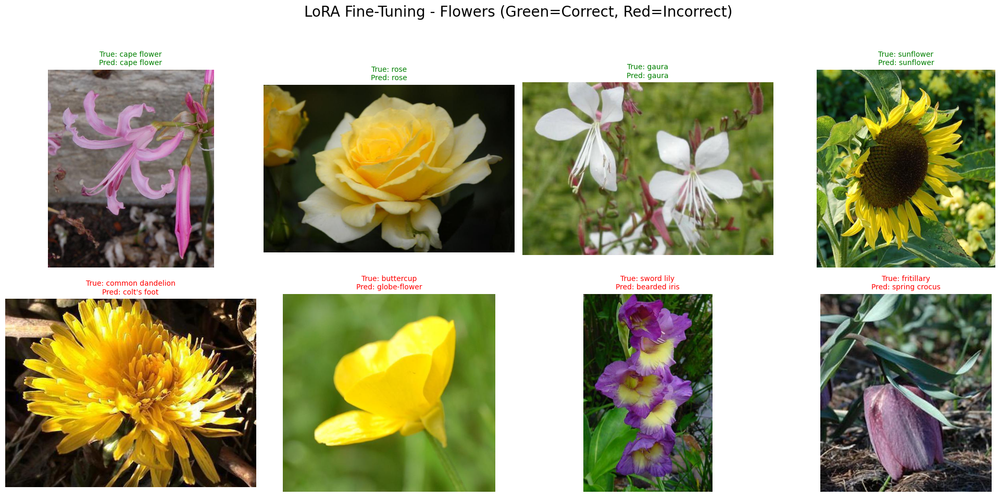

In [ ]:
print("--- Starting Method: LoRA Fine-Tuning ---")
from sklearn.metrics import accuracy_score, classification_report
# === 1. Flowers
DATASET_TO_USE = "Flowers"
NUM_EPOCHS_LORA = 10 
LEARNING_RATE_LORA = 1e-4

dataset_info = data_loaders[DATASET_TO_USE]
num_classes = dataset_info["num_classes"]

# === 2. Load CLIP Vision Model ===
vision_model_lora = CLIPVisionModel.from_pretrained(MODEL_ID).to(DEVICE)
print(f"Loaded {MODEL_ID} vision model to {DEVICE}.")

# === 3. LoRA config (Q/V projections) ===
#
lora_config = LoraConfig(
    r=16, # Rank
    lora_alpha=16,
    target_modules=["q_proj", "v_proj"], # 針對 ViT 的 Q 和 V 矩陣
    lora_dropout=0.1,
    bias="none",
    # task_type=TaskType.FEATURE_EXTRACTION # 我們只用它提特徵
)

# === 4. Wrap with PEFT ===
vision_model_lora = get_peft_model(vision_model_lora, lora_config)
print("\nWrapped vision model with LoRA (PEFT).")
print("LoRA Model - Trainable Parameters:")
vision_model_lora.print_trainable_parameters()

# === 5. Classifier head ===
# ViT-L/14 的 hidden size 是 1024
hidden_dim = vision_model_lora.config.hidden_size
head_lora = nn.Linear(hidden_dim, num_classes).to(DEVICE)
print(f"Created new linear head ({hidden_dim} -> {num_classes}).")
    
# === 6. Training setup ===
criterion = nn.CrossEntropyLoss()
params_to_optimize = list(vision_model_lora.parameters()) + list(head_lora.parameters())
optimizer = torch.optim.Adam(params_to_optimize, lr=LEARNING_RATE_LORA) 

print(f"\nStarting LoRA Fine-Tuning for {DATASET_TO_USE}...")

# === 7. Training Loop ===

train_losses_lora, val_losses_lora, val_accuracies_lora = run_training(
    model=vision_model_lora,
    head=head_lora,
    optimizer=optimizer,
    criterion=criterion,
    dataset_key=DATASET_TO_USE,
    num_epochs=NUM_EPOCHS_LORA,
    is_lora=True
)

# === 8. Plot curves === 
plot_curves(
    train_losses_lora, val_losses_lora, val_accuracies_lora, 
    title_prefix=f"LoRA Fine-Tuning - {DATASET_TO_USE}"
)

# === 9. Test === 
print(f"\nRunning final test for LoRA Fine-Tuning - {DATASET_TO_USE}...")
lora_labels, lora_preds = run_test(vision_model_lora, head_lora, DATASET_TO_USE)

visualize_task2_predictions(
    lora_labels, lora_preds, DATASET_TO_USE, 
    title_prefix=f"LoRA Fine-Tuning - {DATASET_TO_USE}"
)

--- Starting Method: LoRA Fine-Tuning ---
Loaded openai/clip-vit-large-patch14 vision model to cuda.

Wrapped vision model with LoRA (PEFT).
LoRA Model - Trainable Parameters:
trainable params: 1,572,864 || all params: 304,752,640 || trainable%: 0.5161
Created new linear head (1024 -> 200).

Starting LoRA Fine-Tuning for CUB...


Training (LoRA=True):   0%|          | 0/338 [00:00<?, ?it/s]

Validating:   0%|          | 0/38 [00:00<?, ?it/s]

Epoch 1/10 - Train Loss: 3.6969 | Val Loss: 2.0234 | Val Acc: 62.00% | Time: 95.87 sec


Training (LoRA=True):   0%|          | 0/338 [00:00<?, ?it/s]

Validating:   0%|          | 0/38 [00:00<?, ?it/s]

Epoch 2/10 - Train Loss: 1.2512 | Val Loss: 1.0111 | Val Acc: 75.83% | Time: 95.81 sec


Training (LoRA=True):   0%|          | 0/338 [00:00<?, ?it/s]

Validating:   0%|          | 0/38 [00:00<?, ?it/s]

Epoch 3/10 - Train Loss: 0.6339 | Val Loss: 0.7709 | Val Acc: 82.50% | Time: 92.84 sec


Training (LoRA=True):   0%|          | 0/338 [00:00<?, ?it/s]

Validating:   0%|          | 0/38 [00:00<?, ?it/s]

Epoch 4/10 - Train Loss: 0.3999 | Val Loss: 0.6621 | Val Acc: 84.17% | Time: 92.85 sec


Training (LoRA=True):   0%|          | 0/338 [00:00<?, ?it/s]

Validating:   0%|          | 0/38 [00:00<?, ?it/s]

Epoch 5/10 - Train Loss: 0.2633 | Val Loss: 0.6378 | Val Acc: 82.33% | Time: 92.85 sec


Training (LoRA=True):   0%|          | 0/338 [00:00<?, ?it/s]

Validating:   0%|          | 0/38 [00:00<?, ?it/s]

Epoch 6/10 - Train Loss: 0.1674 | Val Loss: 0.5727 | Val Acc: 83.83% | Time: 92.82 sec


Training (LoRA=True):   0%|          | 0/338 [00:00<?, ?it/s]

Validating:   0%|          | 0/38 [00:00<?, ?it/s]

Epoch 7/10 - Train Loss: 0.1054 | Val Loss: 0.5605 | Val Acc: 84.83% | Time: 92.92 sec


Training (LoRA=True):   0%|          | 0/338 [00:00<?, ?it/s]

Validating:   0%|          | 0/38 [00:00<?, ?it/s]

Epoch 8/10 - Train Loss: 0.0676 | Val Loss: 0.5490 | Val Acc: 84.33% | Time: 92.85 sec


Training (LoRA=True):   0%|          | 0/338 [00:00<?, ?it/s]

Validating:   0%|          | 0/38 [00:00<?, ?it/s]

Epoch 9/10 - Train Loss: 0.0405 | Val Loss: 0.5435 | Val Acc: 85.67% | Time: 92.87 sec


Training (LoRA=True):   0%|          | 0/338 [00:00<?, ?it/s]

Validating:   0%|          | 0/38 [00:00<?, ?it/s]

Epoch 10/10 - Train Loss: 0.0301 | Val Loss: 0.5410 | Val Acc: 85.33% | Time: 92.92 sec
Saved training curves to lora_fine-tuning_-_cub_curves.png


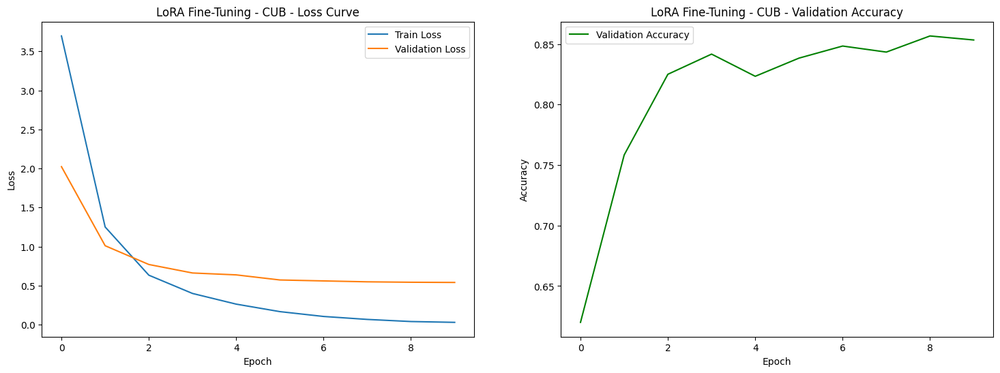


Running final test for LoRA Fine-Tuning - CUB...


Testing:   0%|          | 0/363 [00:00<?, ?it/s]


--- Test Result for CUB ---
Test Accuracy: 86.99%

Classification Report:
                                precision    recall  f1-score   support

        Black footed Albatross       0.79      0.77      0.78        30
              Laysan Albatross       0.93      0.83      0.88        30
               Sooty Albatross       0.74      0.93      0.83        28
             Groove billed Ani       0.94      0.97      0.95        30
                Crested Auklet       0.92      0.86      0.89        14
                  Least Auklet       1.00      1.00      1.00        11
               Parakeet Auklet       1.00      0.96      0.98        23
             Rhinoceros Auklet       0.86      1.00      0.92        18
              Brewer Blackbird       0.59      0.76      0.67        29
          Red winged Blackbird       0.97      0.97      0.97        30
               Rusty Blackbird       0.86      0.63      0.73        30
       Yellow headed Blackbird       0.96      1.00      0.9

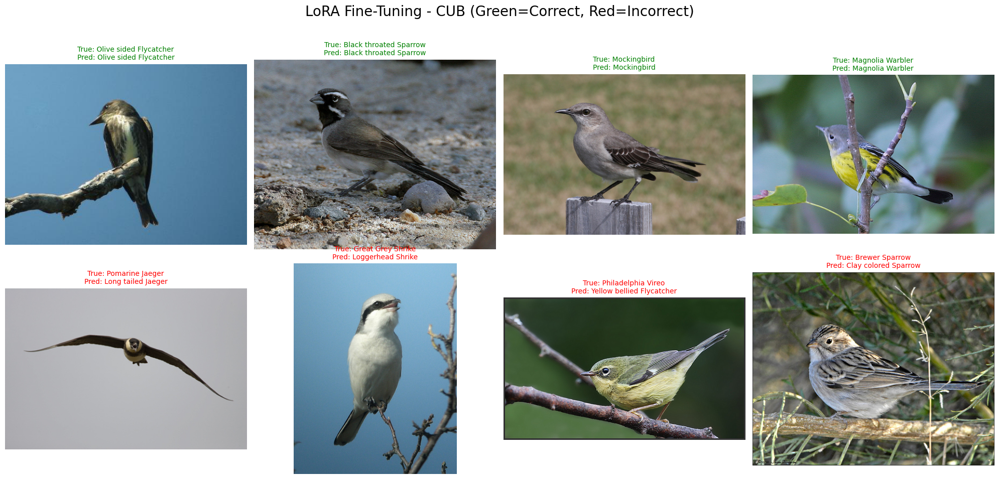

In [ ]:
print("--- Starting Method: LoRA Fine-Tuning ---")
from sklearn.metrics import accuracy_score, classification_report
# === CUB ===
DATASET_TO_USE = "CUB"
NUM_EPOCHS_LORA = 10
LEARNING_RATE_LORA = 1e-4

dataset_info = data_loaders[DATASET_TO_USE]
num_classes = dataset_info["num_classes"]

# === 2. Load CLIP Vision Model ===
vision_model_lora = CLIPVisionModel.from_pretrained(MODEL_ID).to(DEVICE)
print(f"Loaded {MODEL_ID} vision model to {DEVICE}.")

# === 3. LoRA config (Q/V projections) ===
lora_config = LoraConfig(
    r=16, # Rank
    lora_alpha=16,
    target_modules=["q_proj", "v_proj"], # 針對 ViT 的 Q 和 V 矩陣
    lora_dropout=0.1,
    bias="none",
    # task_type=TaskType.FEATURE_EXTRACTION # 我們只用它提特徵
)

# === 4. Wrap with PEFT ===
vision_model_lora = get_peft_model(vision_model_lora, lora_config)
print("\nWrapped vision model with LoRA (PEFT).")
print("LoRA Model - Trainable Parameters:")
vision_model_lora.print_trainable_parameters()

# === 5. Classifier head ===
# ViT-L/14 的 hidden size 是 1024
hidden_dim = vision_model_lora.config.hidden_size
head_lora = nn.Linear(hidden_dim, num_classes).to(DEVICE)
print(f"Created new linear head ({hidden_dim} -> {num_classes}).")
    
# === 6. Training setup ===
criterion = nn.CrossEntropyLoss()
params_to_optimize = list(vision_model_lora.parameters()) + list(head_lora.parameters())
#
optimizer = torch.optim.Adam(params_to_optimize, lr=LEARNING_RATE_LORA) 

print(f"\nStarting LoRA Fine-Tuning for {DATASET_TO_USE}...")

# === 7. Training Loop ===
train_losses_lora, val_losses_lora, val_accuracies_lora = run_training(
    model=vision_model_lora,
    head=head_lora,
    optimizer=optimizer,
    criterion=criterion,
    dataset_key=DATASET_TO_USE,
    num_epochs=NUM_EPOCHS_LORA,
    is_lora=True # 標記為 LoRA
)

# === 8. Plot curves === 
plot_curves(
    train_losses_lora, val_losses_lora, val_accuracies_lora, 
    title_prefix=f"LoRA Fine-Tuning - {DATASET_TO_USE}"
)

# === 9. Test === 
print(f"\nRunning final test for LoRA Fine-Tuning - {DATASET_TO_USE}...")
lora_labels, lora_preds = run_test(vision_model_lora, head_lora, DATASET_TO_USE)

visualize_task2_predictions(
    lora_labels, lora_preds, DATASET_TO_USE, 
    title_prefix=f"LoRA Fine-Tuning - {DATASET_TO_USE}"
)

In [1]:
# ==================================
# === 最終比較表格 (請手動填寫) ===
# ==================================
import pandas as pd

# 1. 準備你的數據
# 請手動將你從 Task 1 和 Task 2 執行結果中
# 看到的 Test Accuracy (xx.xx) 填入下方

# --- Flowers 數據 ---
flowers_zs_acc = 74.74 # <-- 填入 Task 1 的 Flowers 準確率
flowers_lp_acc = 98.39 # <-- 填入 Task 2 Linear Probe 的 Flowers 準確率
flowers_lora_acc = 98.31 # <-- 填入 Task 2 LoRA 的 Flowers 準確率
flowers_cocoop_acc = "N/A" # (選做) [cite: 104]

# --- CUB 數據 ---
cub_zs_acc = 62.32 # <-- 填入 Task 1 的 CUB 準確率
cub_lp_acc = 83.88 # <-- 填入 Task 2 Linear Probe 的 CUB 準確率
cub_lora_acc = 86.99 # <-- 填入 Task 2 LoRA 的 CUB 準確率
cub_cocoop_acc = "N/A" # (選做) [cite: 104]


# 2. 建立表格
table_data = {
    "": ["Zeroshot", "Fine-tune(LP)", "Fine-tune(LoRA)", "CoCoOp (Bonus)"],
    "Oxford 102": [
        f"{flowers_zs_acc:.2f}%", 
        f"{flowers_lp_acc:.2f}%", 
        f"{flowers_lora_acc:.2f}%", 
        flowers_cocoop_acc
    ],
    "CUB 200": [
        f"{cub_zs_acc:.2f}%", 
        f"{cub_lp_acc:.2f}%", 
        f"{cub_lora_acc:.2f}%", 
        cub_cocoop_acc
    ]
}

# 3. 顯示為 Markdown 表格
df = pd.DataFrame(table_data)
print("--- 最終實驗結果比較表 ---")
print(df.to_markdown(index=False))

--- 最終實驗結果比較表 ---
|                 | Oxford 102   | CUB 200   |
|:----------------|:-------------|:----------|
| Zeroshot        | 74.74%       | 62.32%    |
| Fine-tune(LP)   | 98.39%       | 83.88%    |
| Fine-tune(LoRA) | 98.31%       | 86.99%    |
| CoCoOp (Bonus)  | N/A          | N/A       |


成功載入並處理照片: my_ntu_bird.jpg
--- 正在執行模型預測... ---
載入 Zero-Shot (Task 1) 模型...
執行 Linear Probe (Task 2) 預測...
執行 LoRA (Task 2) 預測...

--- 預測頂端結果 ---
Zero-Shot Pred:   Bronzed Cowbird
Linear Probe Pred: Boat tailed Grackle
LoRA Pred:         Mangrove Cuckoo

[成功] 比較圖表已儲存為 'ntu_bird_test_results.png'


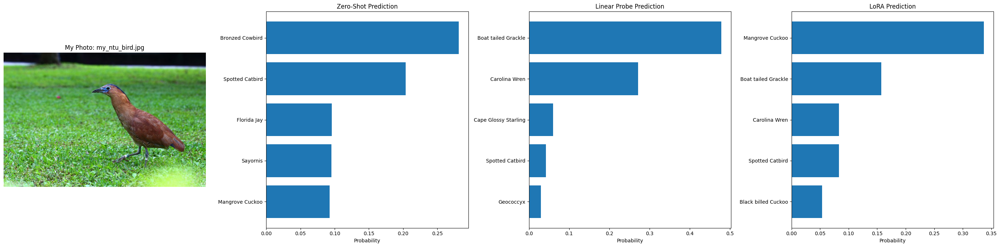

In [ ]:
import PIL.Image
import torch
import matplotlib.pyplot as plt

# ==========================================================
# === 1. 設定你的照片檔名 ===
YOUR_PHOTO_FILENAME = "my_ntu_bird.jpg" 
# ==========================================================


# 取得 CUB-200 的類別名稱 (這在 Cell 6 已經定義)
cub_class_names = data_loaders["CUB"]["class_names"]

# === 2. 載入並預處理你的照片 ===
try:
    image_pil = PIL.Image.open(YOUR_PHOTO_FILENAME).convert("RGB")
    
    # 使用和訓練時一模一樣的 clip_transform
    image_transformed = clip_transform(image_pil) 
    
    # 增加一個 batch 維度並送到 GPU
    image_tensor = image_transformed.unsqueeze(0).to(DEVICE)

    print(f"成功載入並處理照片: {YOUR_PHOTO_FILENAME}")
except FileNotFoundError:
    print(f"錯誤：找不到照片 '{YOUR_PHOTO_FILENAME}'。請檢查檔名並確認已上傳。")
    # 如果找不到檔案，就停止執行
    raise

# === 3. 準備輔助函式 (用來畫出 Top 5 預測) ===
def plot_top5(ax, probs, class_names, title):
    """在指定的 ax 上繪製 Top 5 機率的水平長條圖 """
    top5_probs, top5_indices = torch.topk(probs.squeeze(), 5)
    
    # 將機率和索引轉為 numpy (並移回 CPU)
    top5_probs = top5_probs.cpu().numpy()
    top5_indices = top5_indices.cpu().numpy()
    
    # 取得 Top 5 的類別名稱
    top5_names = [class_names[i] for i in top5_indices]
    
    # 繪圖
    bars = ax.barh(top5_names, top5_probs)
    ax.invert_yaxis() # 讓機率最高的在最上面
    ax.set_title(title)
    ax.set_xlabel("Probability")
    
    # 回傳最高機率的預測名稱 [cite: 427, 438, 451]
    return top5_names[0]


# === 4. 執行三個模型的預測 ===
print("--- 正在執行模型預測... ---")

# --- 4a. Zero-Shot 模型 (Task 1) ---
# (需要重新載入 Task 1 的完整模型和 text features)
print("載入 Zero-Shot (Task 1) 模型...")
model_zs = CLIPModel.from_pretrained(MODEL_ID).to(DEVICE)
model_zs.eval()

# 重新建立 CUB-200 的 text prompts 和 features
cub_prompts = [f"a photo of a {name}" for name in cub_class_names]
text_inputs = processor(text=cub_prompts, return_tensors="pt", padding=True, truncation=True).to(DEVICE)
with torch.no_grad():
    text_features = model_zs.get_text_features(**text_inputs)
    text_features /= text_features.norm(dim=-1, keepdim=True)

# 執行 Zero-Shot 預測
with torch.no_grad():
    image_features_zs = model_zs.get_image_features(pixel_values=image_tensor)
    image_features_zs /= image_features_zs.norm(dim=-1, keepdim=True)
    logits_zs = model_zs.logit_scale.exp() * image_features_zs @ text_features.T
    probs_zs = logits_zs.softmax(dim=-1)


# --- 4b. Linear Probe 模型 (Task 2) ---
print("執行 Linear Probe (Task 2) 預測...")
vision_model.eval()
head.eval()
with torch.no_grad():
    image_features_lp = vision_model(pixel_values=image_tensor).pooler_output
    logits_lp = head(image_features_lp)
    probs_lp = logits_lp.softmax(dim=-1)


# --- 4c. LoRA 模型 (Task 2) ---
print("執行 LoRA (Task 2) 預測...")
vision_model_lora.eval()
head_lora.eval()
with torch.no_grad():
    image_features_lora = vision_model_lora(pixel_values=image_tensor).pooler_output
    logits_lora = head_lora(image_features_lora)
    probs_lora = logits_lora.softmax(dim=-1)


# === 5. 視覺化所有結果 ===
fig, axes = plt.subplots(1, 4, figsize=(28, 7))

# 顯示原始照片
axes[0].imshow(image_pil)
axes[0].set_title(f"My Photo: {YOUR_PHOTO_FILENAME}")
axes[0].axis('off')

# 顯示三個模型的 Top 5 預測
pred_zs = plot_top5(axes[1], probs_zs, cub_class_names, "Zero-Shot Prediction")
pred_lp = plot_top5(axes[2], probs_lp, cub_class_names, "Linear Probe Prediction")
pred_lora = plot_top5(axes[3], probs_lora, cub_class_names, "LoRA Prediction")

plt.tight_layout()
plt.savefig("ntu_bird_test_results.png")
print("\n--- 預測頂端結果 ---")
print(f"Zero-Shot Pred:   {pred_zs}")
print(f"Linear Probe Pred: {pred_lp}")
print(f"LoRA Pred:         {pred_lora}")
print("\n[成功] 比較圖表已儲存為 'ntu_bird_test_results.png'")
plt.show()